# Exploring venues in Berlins neighborhoods

In [1]:
# To read Website tables we need to install lxml

!pip install lxml
import lxml

     |████████████████████████████████| 5.5MB 3.5MB/s eta 0:00:01


In [2]:
#Import table data from wikipedia

import pandas as pd
url='https://de.wikipedia.org/wiki/Verwaltungsgliederung_Berlins'

df_b=pd.read_html(url, header=0, thousands='.', decimal=',')[1]

df_b.head()

,Nr.,Ortsteil,Bezirk,Fläche(km²),Einwohner[2](31. Dezember 2020),Einwohnerpro km²
0,101,Mitte,Mitte,10.70,102338,9564.0
1,102,Moabit,Mitte,7.72,81021,10495.0
2,103,Hansaviertel,Mitte,0.53,5924,11177.0
3,104,Tiergarten,Mitte,5.17,14940,2890.0
4,105,Wedding,Mitte,9.23,85275,9239.0


In [3]:
#Clean dataframe
df_b.drop(["Fläche(km²)","Nr."], axis=1, inplace=True)
df_b.set_axis(['Neighborhood', 'Borough', 'Inhabitants', 'Inhabitants per km²'], axis=1, inplace=True)
df_b.head()

,Neighborhood,Borough,Inhabitants,Inhabitants per km²
0,Mitte,Mitte,102338,9564.0
1,Moabit,Mitte,81021,10495.0
2,Hansaviertel,Mitte,5924,11177.0
3,Tiergarten,Mitte,14940,2890.0
4,Wedding,Mitte,85275,9239.0


In [4]:
# Download geojson file of Berlin neighborhoods

!wget --quiet https://opendata.arcgis.com/datasets/07db170f3f6448dd98973cc53d68dcfc_0.geojson
print('GeoJSON file downloaded!')

GeoJSON file downloaded!


In [5]:
# Install all important libraries

! pip install folium==0.5.0
import folium

import numpy as np

!pip install geopy # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim

import matplotlib.cm as cm
import matplotlib.colors as colors

     |████████████████████████████████| 112kB 5.7MB/s eta 0:00:01


In [6]:
# Install Geocoder library

!pip install geocoder
import geocoder

     |████████████████████████████████| 102kB 4.3MB/s ta 0:00:01


In [7]:
# Get Coordinates of each Neighborhood of Berlin

def get_latlng(neighborhood):
    lat_lng_coords = None
    while(lat_lng_coords is None):
        g = geocoder.arcgis('{}, Berlin, Germany'.format(neighborhood))
        lat_lng_coords = g.latlng
    return lat_lng_coords
# Call the function to get the coordinates, store in a new list using list comprehension
coords = [ get_latlng(neighborhood) for neighborhood in df_b["Neighborhood"].tolist()]

In [8]:
# Create temporary dataframe to populate the coordinates into Latitude and Longitude

df_coords = pd.DataFrame(coords, columns=['Latitude', 'Longitude'])
# Merge the coordinates into the original dataframe
df_b['Latitude'] = df_coords['Latitude']
df_b['Longitude'] = df_coords['Longitude']
df_b.head()

,Neighborhood,Borough,Inhabitants,Inhabitants per km²,Latitude,Longitude
0,Mitte,Mitte,102338,9564.0,52.52119,13.42414
1,Moabit,Mitte,81021,10495.0,52.52570,13.34005
2,Hansaviertel,Mitte,5924,11177.0,52.51679,13.33835
3,Tiergarten,Mitte,14940,2890.0,52.50993,13.36393
4,Wedding,Mitte,85275,9239.0,52.54781,13.35473


In [9]:
# Get top 10 neighborhoods with highest inhabitants

df_b.sort_values(by='Inhabitants', ascending=True, inplace=True)

df_top10_inhabitants = pd.concat([df_b['Neighborhood'], df_b['Inhabitants']], axis=1).tail(10)
df_top10_inhabitants = df_top10_inhabitants.set_index('Neighborhood')

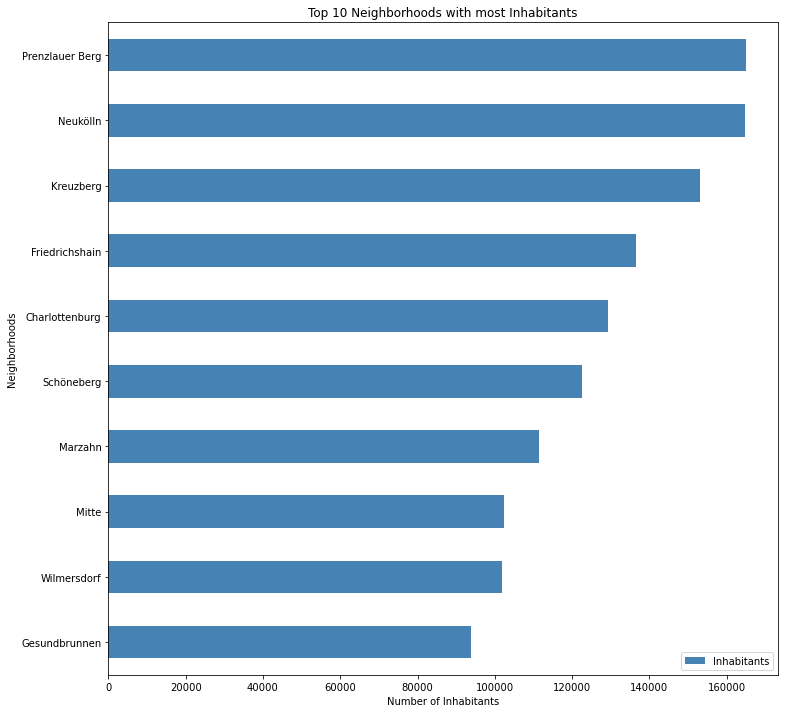

In [10]:
# Generate plot of most inhabitants per Neighborhood
import matplotlib as mpl
import matplotlib.pyplot as plt

df_top10_inhabitants.plot(kind='barh', figsize=(12, 12), color='steelblue')
plt.xlabel('Number of Inhabitants')
plt.ylabel('Neighborhoods')
plt.title('Top 10 Neighborhoods with most Inhabitants')

plt.show()

In [12]:
# Lets look at the highest value, we can see it is Prenzlauer Berg
max_value = df_b["Inhabitants"].max()
df_b.loc[df_b["Inhabitants"] == max_value, "Neighborhood"]

8    Prenzlauer Berg
Name: Neighborhood, dtype: object

In [13]:
# Get the coordinates of Berlin to create a map

Berlin_geo = r'07db170f3f6448dd98973cc53d68dcfc_0.geojson' # geojson file

address = 'Berlin'

geolocator = Nominatim(user_agent="ge_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Berlin are {}, {}.'.format(latitude, longitude))

# create a plain map of Berlin
Berlin_map = folium.Map(location=[latitude, longitude], zoom_start=10)

The geograpical coordinate of Berlin are 52.5170365, 13.3888599.


In [14]:
# Create a map of the inhabitants of Berlin

threshold_scale = np.linspace(df_b['Inhabitants'].min(),
                              df_b['Inhabitants'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1

Berlin_map.choropleth(
    geo_data=Berlin_geo,
    data=df_b,
    columns=['Neighborhood', 'Inhabitants'],
    key_on='feature.properties.ORTSTNAME',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Inhabitants of Berlin',
    reset = True
)

In [15]:
#We can see that many inhabitants live in the Eastern center of Berlin but also in the outer district of Marzahn. 

# loop through the Neighborhoods and add each to the Neighborhoods feature group
for lat, lng, label in zip(df_b.Latitude, df_b.Longitude, df_b.Neighborhood):
    folium.features.CircleMarker(
        [lat, lng],
        radius=5, # define how big you want the circle markers to be
        color='yellow',
        fill=True,
        popup=label,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(Berlin_map)

# add incidents to map
Berlin_map

In [16]:
#Inhabitants pro km2: There are quite a few inhabitants per km2 in Hellersdorf, Neu-Hohenschönhausen, Märkisches Viertel and Gropiusstadt in the outer boroughs

Berlin_Inhabitantskm2_map = folium.Map(location=[latitude, longitude], zoom_start=10)
# create a numpy array of length 6 and has linear spacing from the minium total immigration to the maximum total immigration
threshold_scale = np.linspace(df_b['Inhabitants per km²'].min(),
                              df_b['Inhabitants per km²'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum immigration

Berlin_Inhabitantskm2_map.choropleth(
    geo_data=Berlin_geo,
    data=df_b,
    columns=['Neighborhood', 'Inhabitants per km²'],
    key_on='feature.properties.ORTSTNAME',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Inhabitants per km² of Berlin',
    reset = True
)

# loop through the Neighborhoods and add each to the Neighborhoods feature group
for lat, lng, label in zip(df_b.Latitude, df_b.Longitude, df_b.Neighborhood):
    folium.features.CircleMarker(
        [lat, lng],
        radius=5, # define how big you want the circle markers to be
        color='yellow',
        fill=True,
        popup=label,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(Berlin_Inhabitantskm2_map)

# add incidents to map
Berlin_Inhabitantskm2_map

In [17]:
# Import librarys to be able to read foursquare data

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

In [18]:
#Import data from foursquare grouped by district and merge with the first data frame

CLIENT_ID = 'DMAQLHYMT2G4WM5BR4EQZZ3VKYA0OHXHZMU2GFJXXKBWUI4K'
CLIENT_SECRET = '5K0SGVOBBREUJ350HAKTBV22XYJCQGA5LA2VHCIAL4X2K34O'
VERSION = '20180604'

def getNearbyVenues(names, latitudes, longitudes):
    radius=600
    LIMIT=500
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'],
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood_Latitude', 
                  'Neighborhood_Longitude', 
                  'Venue',
                  'Venue_Latitude', 
                  'Venue_Longitude', 
                  'Venue_Category']
    
    return(nearby_venues)

In [19]:
Berlin_venues = getNearbyVenues(names=df_b['Neighborhood'],
                                latitudes=df_b['Latitude'],
                                longitudes=df_b['Longitude']
                                )
Berlin_venues.head()

Malchow
Stadtrandsiedlung Malchow
Blankenfelde
Falkenberg
Wartenberg
Gatow
Schmöckwitz
Lübars
Hansaviertel
Konradshöhe
Borsigwalde
Müggelheim
Blankenburg
Grünau
Heinersdorf
Wilhelmsruh
Rahnsdorf
Rosenthal
Wannsee
Schlachtensee
Waidmannslust
Grunewald
Plänterwald
Nikolassee
Bohnsdorf
Siemensstadt
Niederschöneweide
Alt-Treptow
Tiergarten
Halensee
Kladow
Haselhorst
Buch
Frohnau
Hermsdorf
Dahlem
Heiligensee
Baumschulenweg
Friedrichshagen
Kaulsdorf
Charlottenburg-Nord
Karow
Johannisthal
Adlershof
Französisch Buchholz
Schmargendorf
Oberschöneweide
Wittenau
Rummelsburg
Friedenau
Karlshorst
Biesdorf
Altglienicke
Mahlsdorf
Hakenfelde
Niederschönhausen
Marienfelde
Fennpfuhl
Tegel
Gropiusstadt
Falkenhagener Feld
Spandau
Märkisches Viertel
Buckow
Wilhelmstadt
Westend
Lichtenberg
Rudow
Britz
Lankwitz
Staaken
Alt-Hohenschönhausen
Lichtenrade
Mariendorf
Zehlendorf
Weißensee
Friedrichsfelde
Neu-Hohenschönhausen
Tempelhof
Pankow
Köpenick
Steglitz
Moabit
Reinickendorf
Hellersdorf
Wedding
Lichterfelde
Ge

,Neighborhood,Neighborhood_Latitude,Neighborhood_Longitude,Venue,Venue_Latitude,Venue_Longitude,Venue_Category
0,Malchow,52.57848,13.483,Storchen-Cafè,52.579214,13.481719,Café
1,Malchow,52.57848,13.483,Wirtshaus Malchow,52.577437,13.483378,German Restaurant
2,Malchow,52.57848,13.483,T-H-R-S Björn Janzen,52.576225,13.482160,Auto Garage
3,Malchow,52.57848,13.483,H Malchow / Dorfstraße,52.575450,13.483194,Bus Stop
4,Malchow,52.57848,13.483,MS-Einbauküchen GbR,52.582121,13.482717,Miscellaneous Shop


In [18]:
#Show the number of venues per neighborhood. We can see that Eastern City Center districts of Berlin have the highest amount of venues, followed by Wedding.
Berlin_venues.groupby(["Neighborhood"]).count().sort_values(by="Venue", ascending=False)

,Neighborhood_Latitude,Neighborhood_Longitude,Venue,Venue_Latitude,Venue_Longitude,Venue_Category
Neighborhood,,,,,,
Prenzlauer Berg,100,100,100,100,100,100
Neukölln,97,97,97,97,97,97
Friedrichshain,90,90,90,90,90,90
Kreuzberg,89,89,89,89,89,89
Wedding,89,89,89,89,89,89
...,...,...,...,...,...,...
Rahnsdorf,4,4,4,4,4,4
Lübars,4,4,4,4,4,4
Altglienicke,4,4,4,4,4,4


# A map with all venues in Berlin

In [20]:
#One can see that there are several venues all over Berlin, especially in the center there are quite a few

from folium import plugins

# let's start again with a clean copy of the map of San Francisco
Berlin_venue_map = folium.Map(location = [latitude, longitude], zoom_start = 12)

# instantiate a mark cluster object for the incidents in the dataframe
venues = plugins.MarkerCluster().add_to(Berlin_venue_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(Berlin_venues.Venue_Latitude, Berlin_venues.Venue_Longitude, Berlin_venues.Venue_Category):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(venues)

# display map
Berlin_venue_map

In [36]:
# Which Venue Categories are there per Neighborhood and how many of them?

# One hot encoding
df_onehot = pd.get_dummies(Berlin_venues[['Venue_Category']], prefix="", prefix_sep="")
# Adding neighborhood column back to dataframe
df_onehot['Neighborhood'] = Berlin_venues['Neighborhood']
# Moving neighborhood column to the first column
fixed_columns = [df_onehot.columns[-1]] + list(df_onehot.columns[:-1])
df_onehot = df_onehot[fixed_columns]
df_grouped=df_onehot.groupby(["Neighborhood"]).sum().reset_index()

df_grouped

,Neighborhood,Zoo Exhibit,ATM,Accessories Store,Adult Boutique,African Restaurant,American Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,...,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Warehouse Store,Waterfall,Waterfront,Wine Bar,Wine Shop,Yemeni Restaurant,Yoga Studio
0,Adlershof,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Alt-Hohenschönhausen,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Alt-Treptow,0,0,0,0,0,0,0,1,0,...,0,1,1,0,0,0,0,0,0,0
3,Altglienicke,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Baumschulenweg,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92,Wilhelmsruh,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
93,Wilhelmstadt,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
94,Wilmersdorf,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
95,Wittenau,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [37]:
print(df_grouped.columns.tolist())

['Neighborhood', 'Zoo Exhibit', 'ATM', 'Accessories Store', 'Adult Boutique', 'African Restaurant', 'American Restaurant', 'Argentinian Restaurant', 'Art Gallery', 'Art Museum', 'Arts & Crafts Store', 'Asian Restaurant', 'Athletics & Sports', 'Austrian Restaurant', 'Auto Dealership', 'Auto Garage', 'Automotive Shop', 'BBQ Joint', 'Bagel Shop', 'Bakery', 'Bank', 'Bar', 'Baseball Field', 'Bath House', 'Bathing Area', 'Bavarian Restaurant', 'Beach Bar', 'Bed & Breakfast', 'Beer Bar', 'Beer Garden', 'Beer Store', 'Big Box Store', 'Bike Shop', 'Bistro', 'Boarding House', 'Boat Rental', 'Boat or Ferry', 'Bookstore', 'Boutique', 'Bowling Alley', 'Brasserie', 'Breakfast Spot', 'Brewery', 'Burger Joint', 'Bus Stop', 'Business Service', 'Cafeteria', 'Café', 'Cajun / Creole Restaurant', 'Camera Store', 'Canal', 'Candy Store', 'Caribbean Restaurant', 'Caucasian Restaurant', 'Cheese Shop', 'Chinese Restaurant', 'Chocolate Shop', 'Climbing Gym', 'Clothing Store', 'Cocktail Bar', 'Coffee Roaster', 'C

In [38]:
#Looking at the dataframe one can see that there are still too many categories that should be matched to get a better overview

df_grouped["Total_venues"] = df_grouped.sum(axis=1)
df_grouped["Restaurants"] = df_grouped[[x for x in df_grouped.columns if "Restaurant" in x]].sum(axis = "columns")
df_grouped["restaurants"] = df_grouped["Restaurants"] + df_grouped["Food Court"] + df_grouped["Street Food Gathering"] + df_grouped["Snack Place"] + df_grouped["Shawarma Place"] + df_grouped["Soup Place"] + df_grouped["Pide Place"] + df_grouped["Food Stand"] + df_grouped["Beer Garden"] + df_grouped["Diner"] + df_grouped["Currywurst Joint"] + df_grouped["Trattoria/Osteria"] + df_grouped["Bistro"] + df_grouped["Deli / Bodega"] + df_grouped["Steakhouse"] + df_grouped["Creperie"] + df_grouped["Brasserie"] + df_grouped["Sandwich Place"] + df_grouped["Pizza Place"] + df_grouped["Fried Chicken Joint"] + df_grouped["Burger Joint"] + df_grouped["Taverna"] + df_grouped["Cafeteria"] + df_grouped["BBQ Joint"]
df_grouped["sum_Shop"] = df_grouped[[x for x in df_grouped.columns if "Shop" in x]].sum(axis = "columns")
df_grouped["sum_Store"] = df_grouped[[x for x in df_grouped.columns if "Store" in x]].sum(axis = "columns")
df_grouped["sum_market"] = df_grouped[[x for x in df_grouped.columns if "market" in x]].sum(axis = "columns")
df_grouped["sum_Market"] = df_grouped[[x for x in df_grouped.columns if "Market" in x]].sum(axis = "columns")
df_grouped["Shopping"] = df_grouped["sum_Shop"] + df_grouped["Piercing Parlor"] + df_grouped["Shopping Mall"] + df_grouped["Newsstand"] + df_grouped["Garden Center"] + df_grouped["Farm"] + df_grouped["Farmers Market"] + df_grouped["Adult Boutique"] + df_grouped["sum_Store"] + df_grouped["Boutique"] + df_grouped["Bookstore"] + df_grouped["Candy Store"] + df_grouped["sum_market"] + df_grouped["sum_Market"] + df_grouped["Drugstore"] + df_grouped["Organic Grocery"] + df_grouped["Pharmacy"]
df_grouped["sum_Bar"] = df_grouped[[x for x in df_grouped.columns if "Bar" in x]].sum(axis = "columns")
df_grouped["sum_Pub"] = df_grouped[[x for x in df_grouped.columns if "Pub" in x]].sum(axis = "columns")
df_grouped["Bars_and_Nightlife"] = df_grouped["sum_Bar"] + df_grouped["sum_Pub"] + df_grouped["Rock Club"] + df_grouped["Nightclub"] + df_grouped["Music Venue"] + df_grouped["Lounge"] + df_grouped["Gastropub"] + df_grouped["Jazz Club"] + df_grouped["Concert Hall"]
df_grouped["Entertainment"] = df_grouped["Laser Tag"] + df_grouped["Planetarium"] + df_grouped["Comedy Club"] + df_grouped["General Entertainment"] + df_grouped["Roof Deck"] + df_grouped["Go Kart Track"] + df_grouped["Soccer Stadium"] + df_grouped["Football Stadium"] + df_grouped["Stadium"] + df_grouped["Brewery"] + df_grouped["Distillery"] + df_grouped["Zoo Exhibit"] + df_grouped["Bowling Alley"] + df_grouped["Multiplex"] + df_grouped["Indie Movie Theater"] + df_grouped["Indie Theater"] + df_grouped["Performing Arts Venue"] + df_grouped["Movie Theater"] + df_grouped["Theater"]
df_grouped["Nature_and_Sights"] = df_grouped["Nature Preserve"] + df_grouped["Street Art"] + df_grouped["Residential Building (Apartment / Condo)"] + df_grouped["Outdoor Sculpture"] + df_grouped["Palace"] + df_grouped["Historic Site"] + df_grouped["Memorial Site"] + df_grouped["Canal"] + df_grouped["Monument / Landmark"] + df_grouped["Scenic Lookout"] + df_grouped["Construction & Landscaping"] + df_grouped["Garden"] + df_grouped["Plaza"] + df_grouped["Park"] + df_grouped["Lake"] + df_grouped["Pedestrian Plaza"] + df_grouped["Pier"] + df_grouped["Fountain"] + df_grouped["Sculpture Garden"] + df_grouped["Tree"] + df_grouped["Waterfall"] + df_grouped["Waterfront"]
df_grouped["Transport"] = df_grouped["Gas Station"] + df_grouped["Road"] + df_grouped["Light Rail Station"] + df_grouped["Metro Station"] + df_grouped["Harbor / Marina"] + df_grouped["Boat or Ferry"] + df_grouped["Auto Garage"] + df_grouped["Auto Dealership"] + df_grouped["Automotive Shop"] + df_grouped["Train Station"] + df_grouped["Tram Station"] + df_grouped["Boat or Ferry"] + df_grouped["Intersection"] + df_grouped["Platform"] + df_grouped["Bus Stop"] + df_grouped["Tunnel"]
df_grouped["Hotels"] = df_grouped["Hotel"] + df_grouped["Hostel"] + df_grouped["Motel"] + df_grouped["Bed & Breakfast"] + df_grouped["Boarding House"]
df_grouped["Cafe"] = df_grouped["Bakery"] + df_grouped["Tea Room"] + df_grouped["Pet Café"] + df_grouped["Café"] + df_grouped["Breakfast Spot"] + df_grouped["Bagel Shop"] + df_grouped["Coffee Roaster"] + df_grouped["Gaming Cafe"]
df_grouped["Service"] = df_grouped["Storage Facility"] + df_grouped["Speakeasy"] + df_grouped["Post Office"] + df_grouped["IT Services"] + df_grouped["Financial or Legal Service"] + df_grouped["Business Service"] + df_grouped["Bank"] + df_grouped["ATM"] + df_grouped["Credit Union"]
df_grouped["Fitness"] = df_grouped["Dance Studio"] + df_grouped["Sports Club"] + df_grouped["Tennis Court"] + df_grouped["Martial Arts School"] + df_grouped["Yoga Studio"] + df_grouped["Gym"] + df_grouped["Gym / Fitness Center"] + df_grouped["Athletics & Sports"] + df_grouped["Soccer Field"] + df_grouped["Baseball Field"]
df_grouped["Museums"] = df_grouped["History Museum"] + df_grouped["Science Museum"] + df_grouped["Art Gallery"] + df_grouped["Art Museum"] + df_grouped["Museum"]
df_grouped["Child_friendly"] = df_grouped["Indoor Play Area"] + df_grouped["Playground"]
df_grouped["Recreation"] = df_grouped["Bath House"] + df_grouped["Recreation Center"] + df_grouped["Sauna / Steam Room"] + df_grouped["Rest Area"] + df_grouped["Spa"] + df_grouped["Bathing Area"] + df_grouped["Massage Studio"] + df_grouped["Pool"] + df_grouped["Boat Rental"]

df_grouped

,Neighborhood,Zoo Exhibit,ATM,Accessories Store,Adult Boutique,African Restaurant,American Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,...,Entertainment,Nature_and_Sights,Transport,Hotels,Cafe,Service,Fitness,Museums,Child_friendly,Recreation
0,Adlershof,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
1,Alt-Hohenschönhausen,0,0,0,0,0,0,0,0,0,...,0,1,2,1,0,0,0,0,1,0
2,Alt-Treptow,0,0,0,0,0,0,0,1,0,...,2,2,6,0,4,1,1,1,0,1
3,Altglienicke,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,Baumschulenweg,0,0,0,0,0,0,0,0,0,...,0,0,4,0,5,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92,Wilhelmsruh,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,1,0,0,0,0
93,Wilhelmstadt,0,0,0,0,0,0,0,0,0,...,0,1,2,0,0,0,0,0,0,0
94,Wilmersdorf,0,0,1,0,0,0,0,0,0,...,0,3,3,3,2,1,0,0,0,0
95,Wittenau,0,1,0,0,0,0,1,0,0,...,0,0,1,0,2,1,0,0,0,0


In [39]:
# clean up the dataset to remove already summed up columns 
df_all_venues = df_grouped.drop(df_grouped.columns[1:271], axis=1).sort_values(by="Total_venues", ascending=False)
df_all_venues = df_all_venues.drop(["sum_Shop","sum_Store","sum_market","Restaurants","sum_Market","sum_Bar","sum_Pub"], axis=1)

df_all_venues

,Neighborhood,Total_venues,restaurants,Shopping,Bars_and_Nightlife,Entertainment,Nature_and_Sights,Transport,Hotels,Cafe,Service,Fitness,Museums,Child_friendly,Recreation
68,Prenzlauer Berg,100,28,28,14,2,4,1,0,23,0,0,0,1,1
61,Neukölln,96,33,13,28,7,2,0,0,9,1,0,2,0,1
89,Wedding,92,33,31,6,6,3,0,0,15,0,0,0,0,0
44,Kreuzberg,90,30,25,10,5,3,1,3,9,0,3,1,0,2
23,Friedrichshain,89,34,19,10,2,3,2,0,17,0,2,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34,Heiligensee,4,3,1,0,0,0,0,0,0,0,0,0,0,0
37,Hermsdorf,4,0,4,0,0,0,0,0,0,0,0,0,0,0
3,Altglienicke,4,0,3,0,1,0,0,0,0,0,0,0,0,0
17,Falkenhagener Feld,4,1,3,0,0,0,0,0,0,0,0,0,0,0


In [40]:
#Display a map of the districts with the most venues: Most venues are in the Eastern center of Berlin as well as in Wedding up north

Berlin_geo = r'07db170f3f6448dd98973cc53d68dcfc_0.geojson' # geojson file

address = 'Berlin'

geolocator = Nominatim(user_agent="ge_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude

# create a plain world map
Berlin_most_venues_map = folium.Map(location=[latitude, longitude], zoom_start=10)

# create a numpy array of length 6 and has linear spacing from the minium total immigration to the maximum total immigration
threshold_scale = np.linspace(df_all_venues['Total_venues'].min(),
                              df_all_venues['Total_venues'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum immigration

Berlin_most_venues_map.choropleth(
    geo_data=Berlin_geo,
    data=df_all_venues,
    columns=['Neighborhood', 'Total_venues'],
    key_on='feature.properties.ORTSTNAME',
    threshold_scale=threshold_scale,
    fill_color='YlGnBu',
    fill_opacity=0.8, 
    line_opacity=0.2,
    legend_name='Venues',
    reset = True
)

# loop through the Neighborhoods and add each to the Neighborhoods feature group
for lat, lng, label in zip(df_b.Latitude, df_b.Longitude, df_b.Neighborhood):
    folium.features.CircleMarker(
        [lat, lng],
        radius=5, # define how big you want the circle markers to be
        color='yellow',
        fill=True,
        popup=label,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(Berlin_most_venues_map)

# add incidents to map
Berlin_most_venues_map


In [41]:
# let's combine inhabitants and number of venues: 
Berlin_venue_inhabitant_map = folium.Map(location=[latitude, longitude], zoom_start=10)
# create a numpy array of length 6 and has linear spacing from the minium total immigration to the maximum total immigration
threshold_scale = np.linspace(df_b['Inhabitants'].min(),
                              df_b['Inhabitants'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum immigration

Berlin_venue_inhabitant_map.choropleth(
    geo_data=Berlin_geo,
    data=df_b,
    columns=['Neighborhood', 'Inhabitants'],
    key_on='feature.properties.ORTSTNAME',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.6, 
    line_opacity=0.2,
    legend_name='Inhabitants of Berlin',
    reset = True
)

In [42]:
# Where there live fewer people, there are fewer venues.
#We can see that Wedding, Friedrichshain, Prenzlauer Berg, Kreuzberg and Neukölln are the Neighborhoods with the highest number of venues. However Districts like Marzahn, Köpenick or Lichterfelde have quite a lot inhabitants but only few venues to go to.
#Tegel has quite a few venues but not so many inhabitants. As this airport has been closed only recently, there is quite a lot of potential for it to increase its inhabitants

# instantiate a mark cluster object for the incidents in the dataframe
venues = plugins.MarkerCluster().add_to(Berlin_venue_inhabitant_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(Berlin_venues.Venue_Latitude, Berlin_venues.Venue_Longitude, Berlin_venues.Venue_Category):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(venues)

# display map
Berlin_venue_inhabitant_map

# Which venues are most common in which district?

In [33]:
df_all_venues.sort_values(by='restaurants', ascending=True, inplace=True)

# get top 10 neighborhoods with highest inhabitants
df_top10_restaurants = pd.concat([df_all_venues['Neighborhood'], df_all_venues['restaurants']], axis=1).tail(10)
df_top10_restaurants = df_top10_restaurants.set_index('Neighborhood')

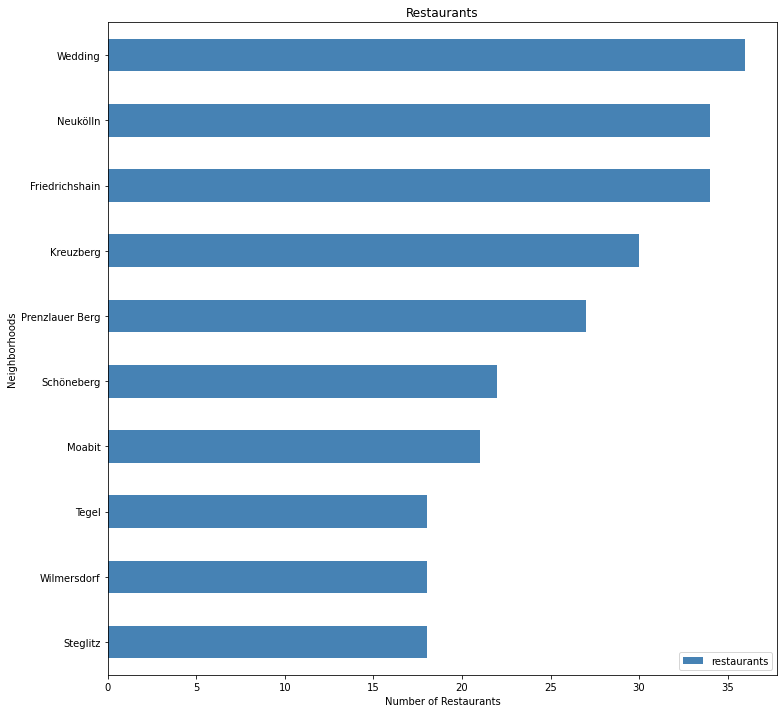

In [34]:
# generate plot: Wedding, Neukölln, Friedrichshain have the most Restaurants in Berlin
import matplotlib as mpl
import matplotlib.pyplot as plt

df_top10_restaurants.plot(kind='barh', figsize=(12, 12), color='steelblue')
plt.xlabel('Number of Restaurants')
plt.ylabel('Neighborhoods')
plt.title('Restaurants')

plt.show()

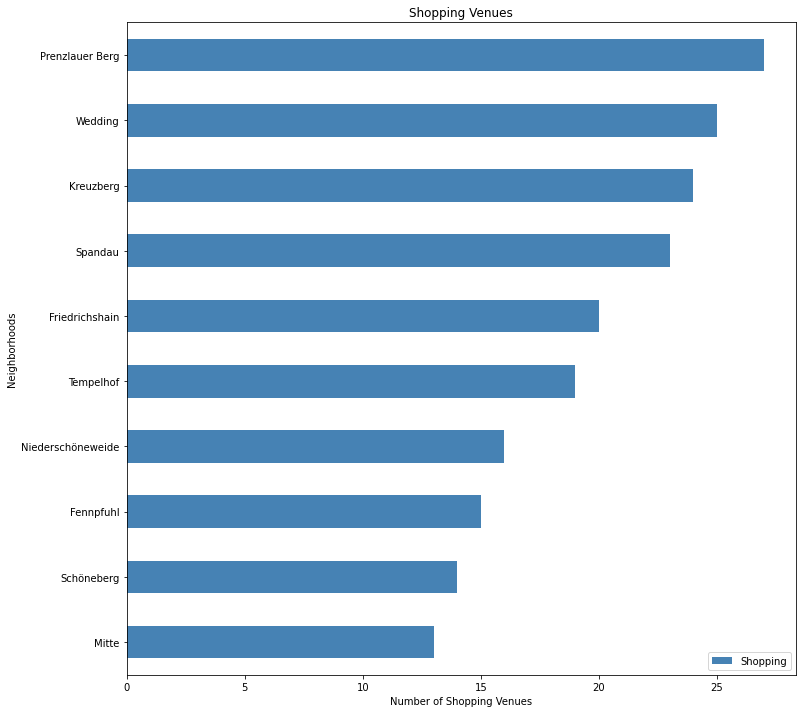

In [36]:
# For Shopping: Prenzlauer Berg, Wedding, Kreuzberg but also Spandau
df_all_venues.sort_values(by='Shopping', ascending=True, inplace=True)

# get top 10 neighborhoods with highest shopping
df_top10_shopping = pd.concat([df_all_venues['Neighborhood'], df_all_venues['Shopping']], axis=1).tail(10)
df_top10_shopping = df_top10_shopping.set_index('Neighborhood')

df_top10_shopping.plot(kind='barh', figsize=(12, 12), color='steelblue')
plt.xlabel('Number of Shopping Venues')
plt.ylabel('Neighborhoods')
plt.title('Shopping Venues')

plt.show()

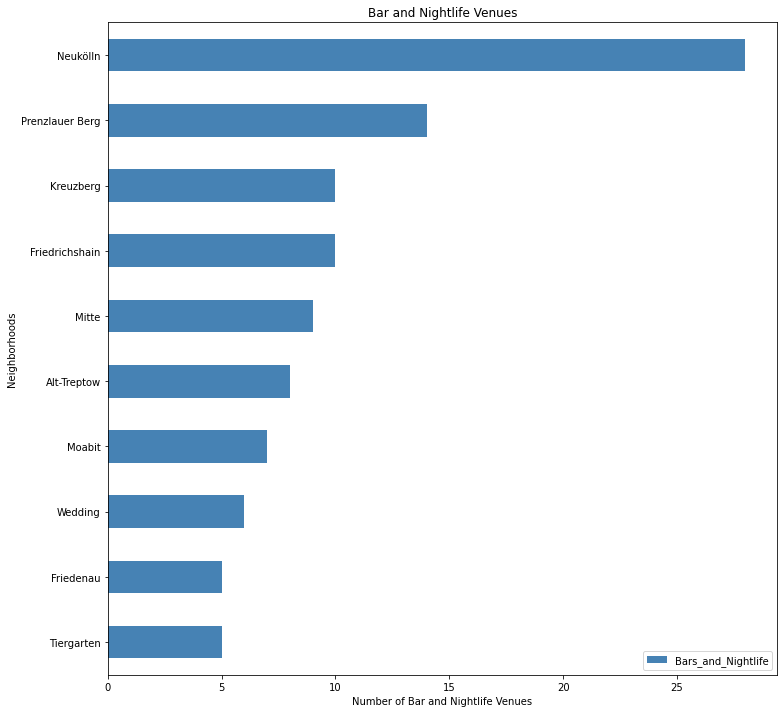

In [37]:
#For Bar and Nightlife: Neukölln is the best area by far
df_all_venues.sort_values(by='Bars_and_Nightlife', ascending=True, inplace=True)

# get top 10 neighborhoods with highest shopping
df_top10_Bars_and_Nightlife = pd.concat([df_all_venues['Neighborhood'], df_all_venues['Bars_and_Nightlife']], axis=1).tail(10)
df_top10_Bars_and_Nightlife = df_top10_Bars_and_Nightlife.set_index('Neighborhood')

df_top10_Bars_and_Nightlife.plot(kind='barh', figsize=(12, 12), color='steelblue')
plt.xlabel('Number of Bar and Nightlife Venues')
plt.ylabel('Neighborhoods')
plt.title('Bar and Nightlife Venues')

plt.show()

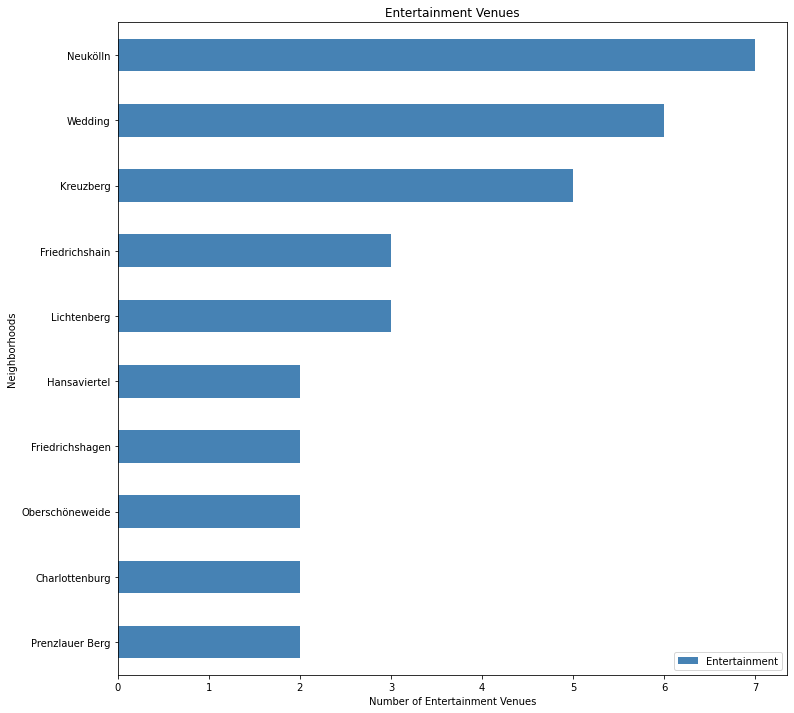

In [38]:
# Entertainment Venues: Neukölln, Wedding and Kreuzberg, however the numbers are quite low in all neighborhoods

df_all_venues.sort_values(by='Entertainment', ascending=True, inplace=True)

# get top 10 neighborhoods with highest Entertainment
df_top10_Entertainment = pd.concat([df_all_venues['Neighborhood'], df_all_venues['Entertainment']], axis=1).tail(10)
df_top10_Entertainment = df_top10_Entertainment.set_index('Neighborhood')

df_top10_Entertainment.plot(kind='barh', figsize=(12, 12), color='steelblue')
plt.xlabel('Number of Entertainment Venues')
plt.ylabel('Neighborhoods')
plt.title('Entertainment Venues')

plt.show()

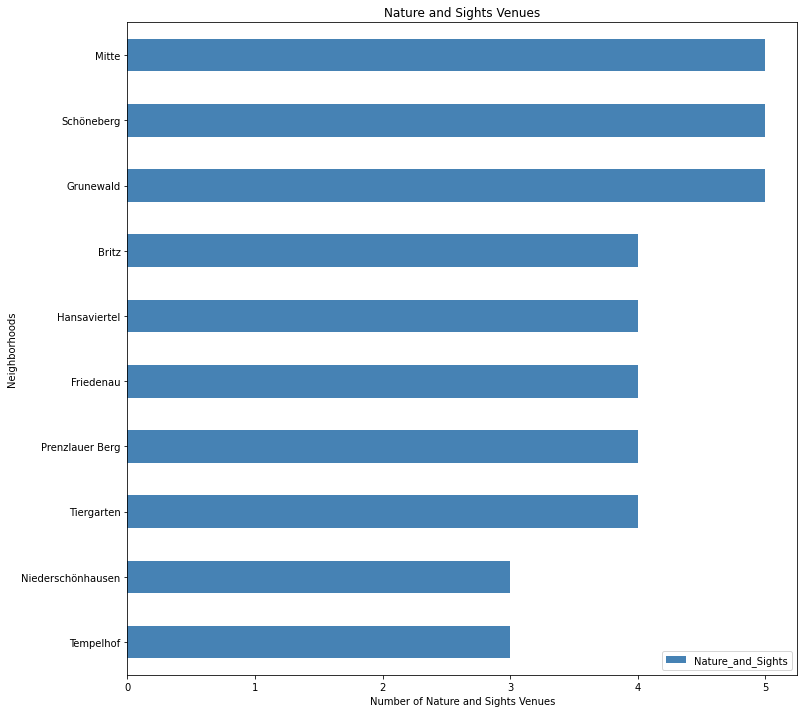

In [39]:
#Mitte, Schöneberg and Grunewald have the highest number of Nature and Sight Venues, however it is a small number
df_all_venues.sort_values(by='Nature_and_Sights', ascending=True, inplace=True)

# get top 10 neighborhoods with highest Nature_and_Sights
df_top10_Nature_and_Sights = pd.concat([df_all_venues['Neighborhood'], df_all_venues['Nature_and_Sights']], axis=1).tail(10)
df_top10_Nature_and_Sights = df_top10_Nature_and_Sights.set_index('Neighborhood')

df_top10_Nature_and_Sights.plot(kind='barh', figsize=(12, 12), color='steelblue')
plt.xlabel('Number of Nature and Sights Venues')
plt.ylabel('Neighborhoods')
plt.title('Nature and Sights Venues')

plt.show()

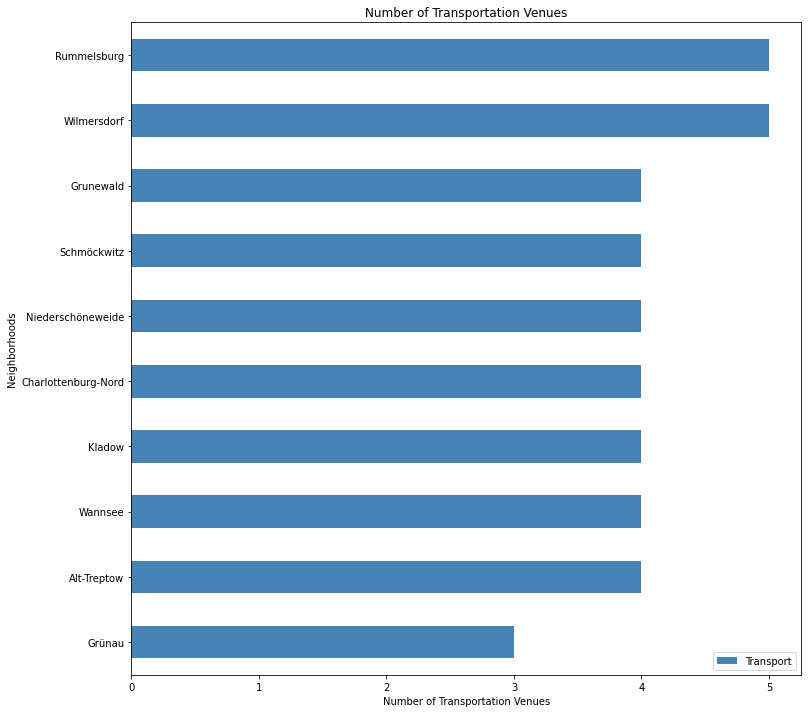

In [40]:
#Rummelsburg, Wilmersdorf have the highest number of Transportation Venues, however it is a small number > it seems that only remarkable features of transportation are named here
df_all_venues.sort_values(by='Transport', ascending=True, inplace=True)

# get top 10 neighborhoods with highest Transport
df_top10_Transport = pd.concat([df_all_venues['Neighborhood'], df_all_venues['Transport']], axis=1).tail(10)
df_top10_Transport = df_top10_Transport.set_index('Neighborhood')

df_top10_Transport.plot(kind='barh', figsize=(12, 12), color='steelblue')
plt.xlabel('Number of Transportation Venues')
plt.ylabel('Neighborhoods')
plt.title('Number of Transportation Venues')

plt.show()

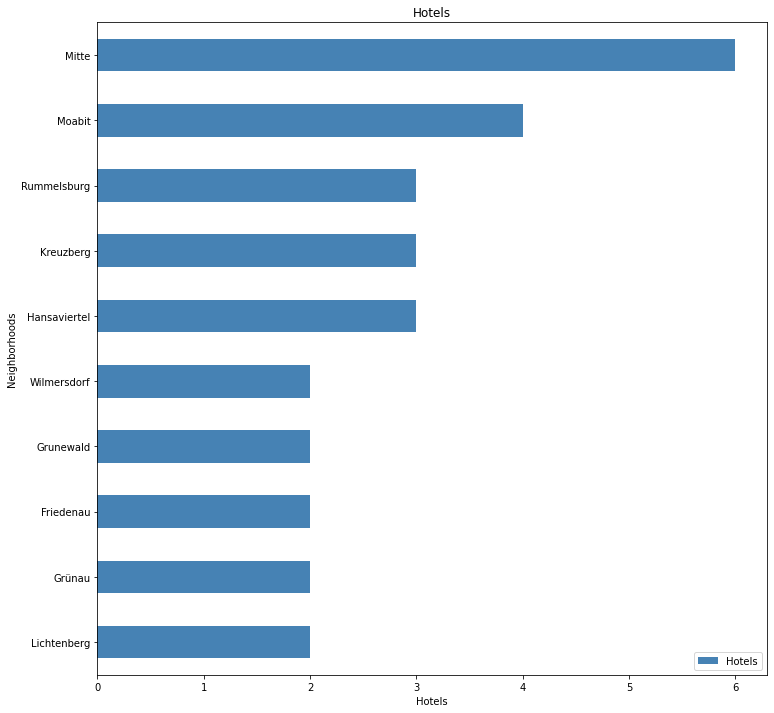

In [41]:
#Mitte and Moabit have the highest number of Hotels, however it is a small number
df_all_venues.sort_values(by='Hotels', ascending=True, inplace=True)

# get top 10 neighborhoods with highest Hotels
df_top10_Hotels = pd.concat([df_all_venues['Neighborhood'], df_all_venues['Hotels']], axis=1).tail(10)
df_top10_Hotels = df_top10_Hotels.set_index('Neighborhood')

df_top10_Hotels.plot(kind='barh', figsize=(12, 12), color='steelblue')
plt.xlabel('Hotels')
plt.ylabel('Neighborhoods')
plt.title('Hotels')

plt.show()

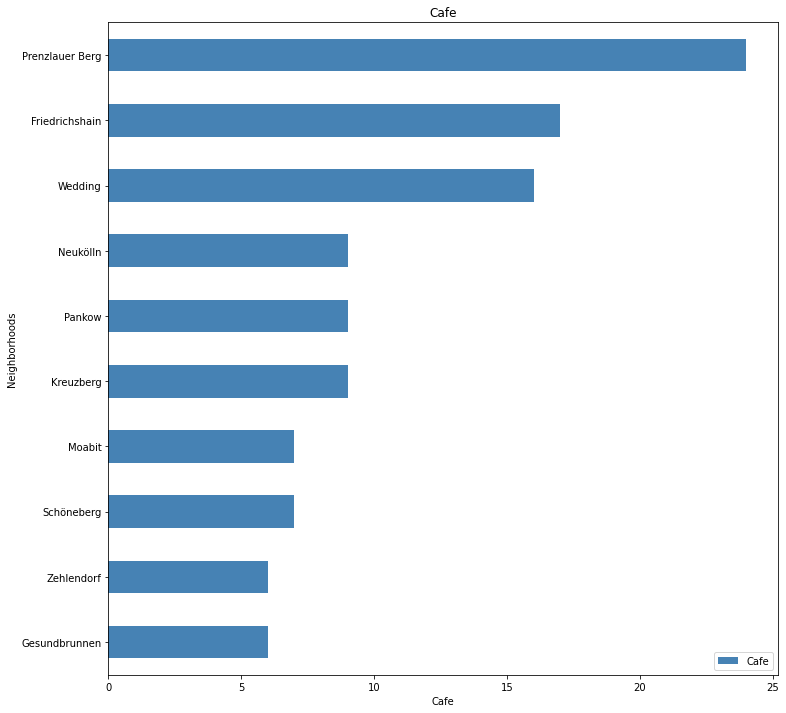

In [42]:
#Prenzlauer Berg is the area with the most Cafes by far, followed by Friedrichshain and Wedding
df_all_venues.sort_values(by='Cafe', ascending=True, inplace=True)

# get top 10 neighborhoods with highest Cafe
df_top10_Cafe = pd.concat([df_all_venues['Neighborhood'], df_all_venues['Cafe']], axis=1).tail(10)
df_top10_Cafe = df_top10_Cafe.set_index('Neighborhood')

df_top10_Cafe.plot(kind='barh', figsize=(12, 12), color='steelblue')
plt.xlabel('Cafe')
plt.ylabel('Neighborhoods')
plt.title('Cafe')

plt.show()

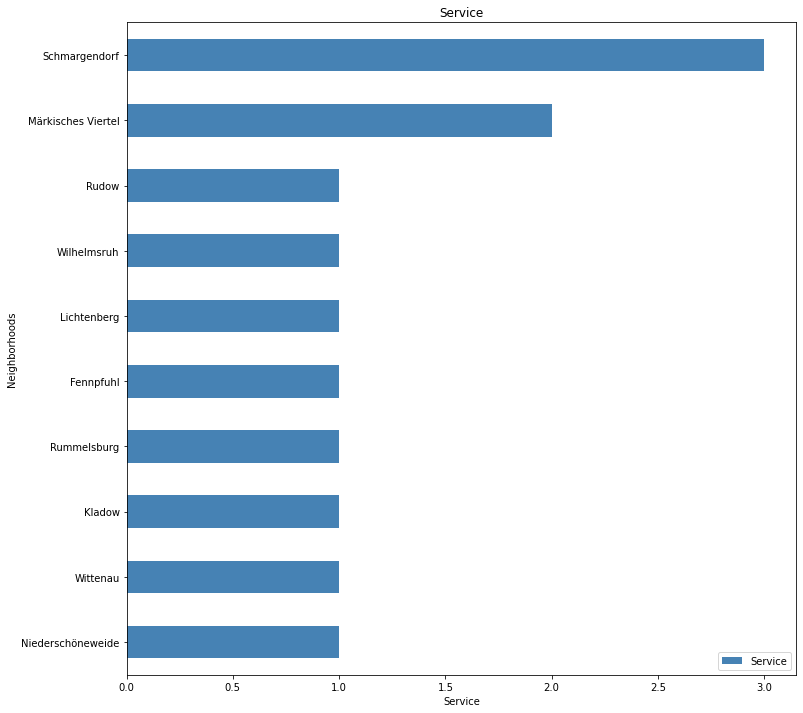

In [43]:
#Very few numbers for Service
df_all_venues.sort_values(by='Service', ascending=True, inplace=True)

# get top 10 neighborhoods with highest Service
df_top10_Service = pd.concat([df_all_venues['Neighborhood'], df_all_venues['Service']], axis=1).tail(10)
df_top10_Service = df_top10_Service.set_index('Neighborhood')

df_top10_Service.plot(kind='barh', figsize=(12, 12), color='steelblue')
plt.xlabel('Service')
plt.ylabel('Neighborhoods')
plt.title('Service')

plt.show()

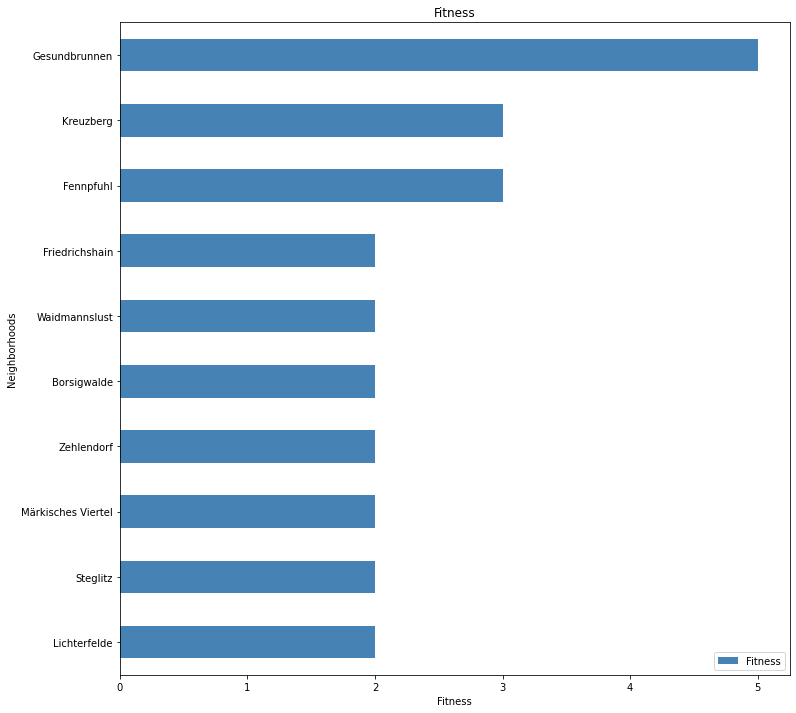

In [44]:
#Very few numbers for Fitness, Gesundbrunnen is first
df_all_venues.sort_values(by='Fitness', ascending=True, inplace=True)

# get top 10 neighborhoods with highest Service
df_top10_Fitness = pd.concat([df_all_venues['Neighborhood'], df_all_venues['Fitness']], axis=1).tail(10)
df_top10_Fitness = df_top10_Fitness.set_index('Neighborhood')

df_top10_Fitness.plot(kind='barh', figsize=(12, 12), color='steelblue')
plt.xlabel('Fitness')
plt.ylabel('Neighborhoods')
plt.title('Fitness')

plt.show()

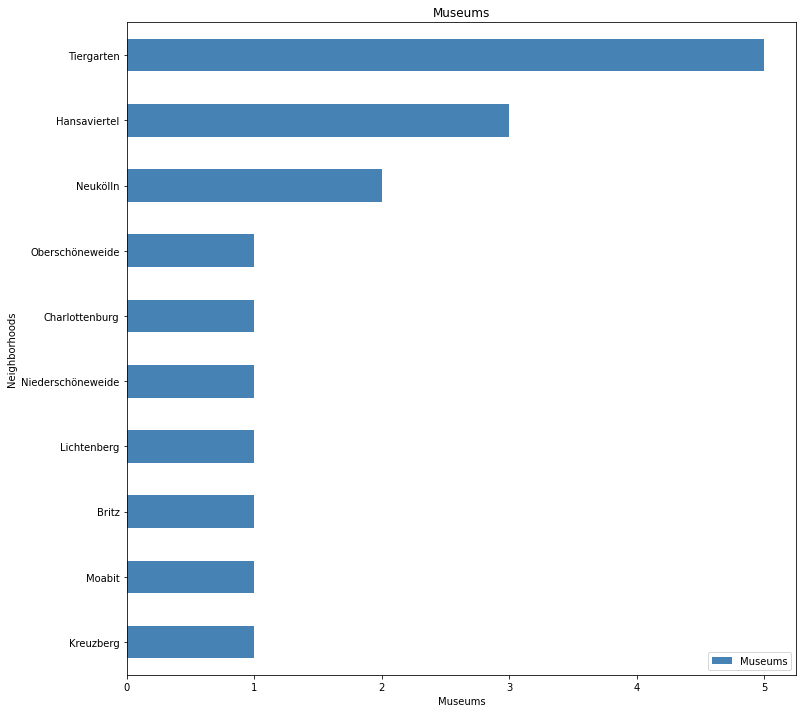

In [45]:
#Very few numbers for Museums, however Tiergarten is first, also Hansaviertel and Neukölln
df_all_venues.sort_values(by='Museums', ascending=True, inplace=True)

# get top 10 neighborhoods with highest Museums
df_top10_Museums = pd.concat([df_all_venues['Neighborhood'], df_all_venues['Museums']], axis=1).tail(10)
df_top10_Museums = df_top10_Museums.set_index('Neighborhood')

df_top10_Museums.plot(kind='barh', figsize=(12, 12), color='steelblue')
plt.xlabel('Museums')
plt.ylabel('Neighborhoods')
plt.title('Museums')

plt.show()

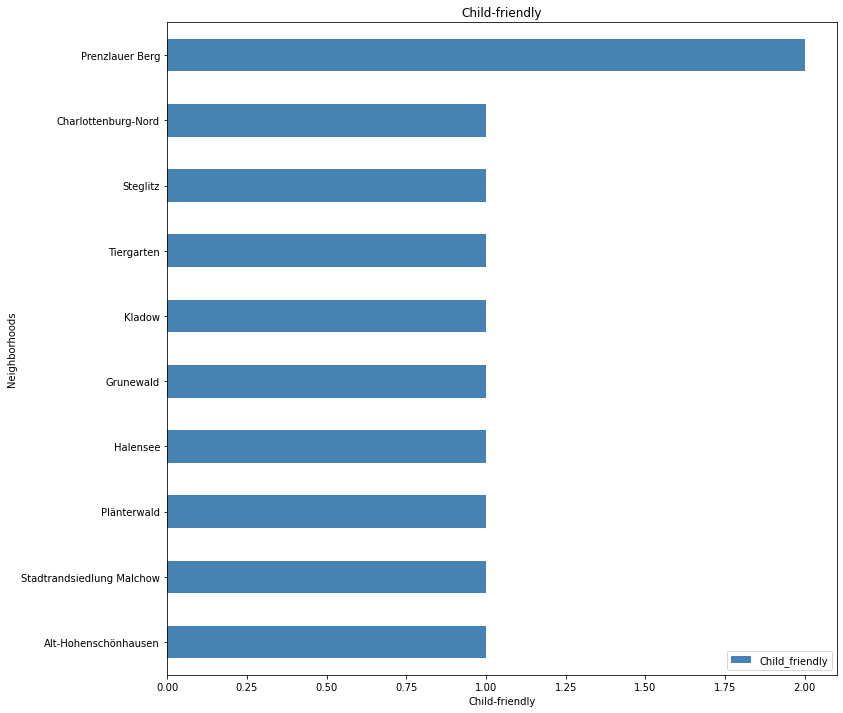

In [57]:
#Very few numbers for child-friendly
df_all_venues.sort_values(by='Child_friendly', ascending=True, inplace=True)

# get top 10 neighborhoods with highest Child-friendly
df_top10_Child_friendly = pd.concat([df_all_venues['Neighborhood'], df_all_venues['Child_friendly']], axis=1).tail(10)
df_top10_Child_friendly = df_top10_Child_friendly.set_index('Neighborhood')

df_top10_Child_friendly.plot(kind='barh', figsize=(12, 12), color='steelblue')
plt.xlabel('Child-friendly')
plt.ylabel('Neighborhoods')
plt.title('Child-friendly')

plt.show()

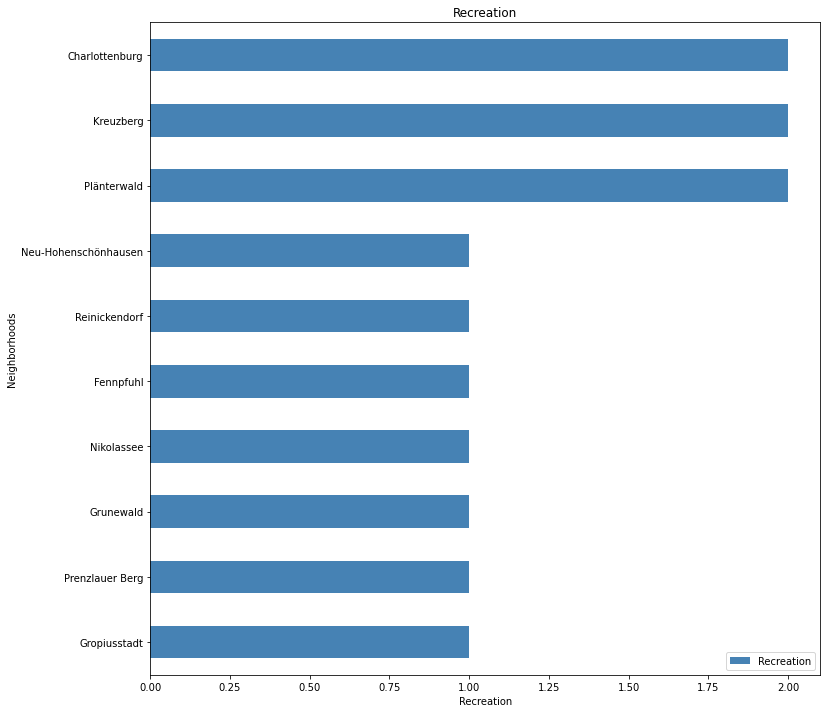

In [50]:
#Very few numbers
df_all_venues.sort_values(by='Recreation', ascending=True, inplace=True)

# get top 10 neighborhoods with highest Recreation
df_top10_Recreation = pd.concat([df_all_venues['Neighborhood'], df_all_venues['Recreation']], axis=1).tail(10)
df_top10_Recreation = df_top10_Recreation.set_index('Neighborhood')

df_top10_Recreation.plot(kind='barh', figsize=(12, 12), color='steelblue')
plt.xlabel('Recreation')
plt.ylabel('Neighborhoods')
plt.title('Recreation')

plt.show()

# Cluster Berlins Neighborhoods based on Venues

In [54]:
# Drop columns in the df_grouped dataframe so that only 0/1 are displayed
df_encoding = df_grouped.drop(df_grouped.columns[271:292], axis=1)

In [55]:
df_encoding.head()

,Neighborhood,Zoo Exhibit,ATM,Accessories Store,Adult Boutique,African Restaurant,American Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,...,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Warehouse Store,Waterfall,Waterfront,Wine Bar,Wine Shop,Yemeni Restaurant,Yoga Studio
0,Adlershof,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Alt-Hohenschönhausen,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Alt-Treptow,0,0,0,0,0,0,0,1,0,...,0,1,1,0,0,0,0,0,0,0
3,Altglienicke,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Baumschulenweg,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


In [71]:
# Let's define a function to sort the venues in descending order

def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [72]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = df_encoding['Neighborhood']

for ind in np.arange(df_encoding.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(df_encoding.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Adlershof,Supermarket,Plaza,Trattoria/Osteria,Steakhouse,German Restaurant,Drugstore,Athletics & Sports,Greek Restaurant,Italian Restaurant,Department Store
1,Alt-Hohenschönhausen,Supermarket,Drugstore,Tram Station,Indian Restaurant,Coffee Shop,Memorial Site,Liquor Store,Discount Store,Big Box Store,Playground
2,Alt-Treptow,Nightclub,Platform,Bakery,Italian Restaurant,Bus Stop,Café,Rock Club,Speakeasy,Light Rail Station,Bistro
3,Altglienicke,Supermarket,Discount Store,Bowling Alley,Yoga Studio,Farm,Farmers Market,Fast Food Restaurant,Financial or Legal Service,Fish Market,Fishing Store
4,Baumschulenweg,Bakery,Italian Restaurant,Supermarket,Bus Stop,Platform,Café,Drugstore,Shipping Store,Newsstand,Chinese Restaurant


In [73]:
# import k-means from clustering stage
from sklearn.cluster import KMeans

# set number of clusters
kclusters = 3

Berlin_grouped_clustering = df_encoding.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Berlin_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([2, 2, 0, 2, 0, 2, 2, 2, 2, 2], dtype=int32)

In [74]:
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

Berlin_merged = df_b

# merge df_grouped with df_b to add latitude/longitude for each neighborhood
Berlin_merged = Berlin_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

Berlin_merged.head()

,Neighborhood,Borough,Inhabitants,Inhabitants per km²,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
80,Malchow,Lichtenberg,643,417.5,52.57848,13.48300,2,Bus Stop,Auto Garage,Nature Preserve,Miscellaneous Shop,German Restaurant,Café,Fishing Store,Fast Food Restaurant,Financial or Legal Service,Fish Market
13,Stadtrandsiedlung Malchow,Pankow,1120,197.2,52.57038,13.46342,2,Restaurant,Playground,Bus Stop,Yoga Studio,Empanada Restaurant,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Financial or Legal Service
15,Blankenfelde,Pankow,2058,153.6,52.61855,13.39017,2,Café,Clothing Store,Yoga Studio,Fish Market,Farm,Farmers Market,Fast Food Restaurant,Financial or Legal Service,Fishing Store,Empanada Restaurant
79,Falkenberg,Lichtenberg,2189,715.4,52.56965,13.53856,2,Post Office,Nature Preserve,Café,Coffee Shop,Yoga Studio,Financial or Legal Service,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant
81,Wartenberg,Lichtenberg,2578,372.5,52.57503,13.51703,2,Supermarket,Discount Store,Soccer Field,Yoga Studio,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Financial or Legal Service,Fish Market


In [75]:
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Berlin_merged['Latitude'], Berlin_merged['Longitude'], Berlin_merged['Neighborhood'], Berlin_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [76]:
Berlin_merged.loc[Berlin_merged['Cluster Labels'] == 0, Berlin_merged.columns[[1] + list(range(5, Berlin_merged.shape[1]))]]

,Borough,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
30,Spandau,13.26406,0,Italian Restaurant,Supermarket,IT Services,Café,German Restaurant,Park,Metro Station,Bakery,Coffee Shop,BBQ Joint
56,Treptow-Köpenick,13.45711,0,Nightclub,Platform,Bakery,Italian Restaurant,Bus Stop,Café,Rock Club,Speakeasy,Light Rail Station,Bistro
58,Treptow-Köpenick,13.48840,0,Bakery,Italian Restaurant,Supermarket,Bus Stop,Platform,Café,Drugstore,Shipping Store,Newsstand,Chinese Restaurant
23,Charlottenburg-Wilmersdorf,13.28798,0,Italian Restaurant,Plaza,Ice Cream Shop,Café,Chinese Restaurant,Bank,Drugstore,Deli / Bodega,Coffee Shop,Bookstore
46,Tempelhof-Schöneberg,13.33269,0,Café,Supermarket,Hotel,Plaza,Bistro,Bar,Italian Restaurant,Korean Restaurant,Vietnamese Restaurant,Indian Restaurant
77,Lichtenberg,13.52547,0,Bakery,Italian Restaurant,Café,Organic Grocery,Doner Restaurant,Light Rail Station,Supermarket,German Restaurant,Chinese Restaurant,Park
18,Pankow,13.40362,0,Café,Italian Restaurant,Tram Station,Plaza,Greek Restaurant,Movie Theater,Breakfast Spot,Bus Stop,Gas Station,Organic Grocery
84,Lichtenberg,13.46654,0,Supermarket,Drugstore,Soccer Field,Bakery,Tram Station,Fishing Store,Furniture / Home Store,Café,Big Box Store,Light Rail Station
87,Reinickendorf,13.27896,0,Café,Restaurant,Ice Cream Shop,Indian Restaurant,Supermarket,Market,Clothing Store,Organic Grocery,Falafel Restaurant,Beer Garden
28,Spandau,13.20216,0,Bakery,Clothing Store,Drugstore,Trattoria/Osteria,Pub,Mobile Phone Shop,Italian Restaurant,Supermarket,Fast Food Restaurant,Café


In [77]:
Berlin_merged.loc[Berlin_merged['Cluster Labels'] == 1, Berlin_merged.columns[[1] + list(range(5, Berlin_merged.shape[1]))]]

,Borough,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
4,Mitte,13.35473,1,Café,Bar,Drugstore,Turkish Restaurant,Bakery,Middle Eastern Restaurant,Italian Restaurant,Korean Restaurant,Doner Restaurant,Pizza Place
6,Friedrichshain-Kreuzberg,13.45403,1,Café,Pub,Middle Eastern Restaurant,Vegetarian / Vegan Restaurant,Thai Restaurant,Doner Restaurant,Coffee Shop,Plaza,Bakery,Yoga Studio
7,Friedrichshain-Kreuzberg,13.38358,1,Italian Restaurant,Café,Bar,Ice Cream Shop,Trattoria/Osteria,Coffee Shop,Park,Pastry Shop,Theater,Thrift / Vintage Store
51,Neukölln,13.43541,1,Bar,Café,Coffee Shop,Italian Restaurant,Cocktail Bar,Middle Eastern Restaurant,Bistro,Lebanese Restaurant,Dive Bar,Turkish Restaurant
8,Pankow,13.42575,1,Café,Bakery,Coffee Shop,Cocktail Bar,Asian Restaurant,Beer Bar,Falafel Restaurant,Bar,Ice Cream Shop,Italian Restaurant


In [78]:
Berlin_merged.loc[Berlin_merged['Cluster Labels'] == 2, Berlin_merged.columns[[1] + list(range(5, Berlin_merged.shape[1]))]]

,Borough,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
80,Lichtenberg,13.48300,2,Bus Stop,Auto Garage,Nature Preserve,Miscellaneous Shop,German Restaurant,Café,Fishing Store,Fast Food Restaurant,Financial or Legal Service,Fish Market
13,Pankow,13.46342,2,Restaurant,Playground,Bus Stop,Yoga Studio,Empanada Restaurant,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Financial or Legal Service
15,Pankow,13.39017,2,Café,Clothing Store,Yoga Studio,Fish Market,Farm,Farmers Market,Fast Food Restaurant,Financial or Legal Service,Fishing Store,Empanada Restaurant
79,Lichtenberg,13.53856,2,Post Office,Nature Preserve,Café,Coffee Shop,Yoga Studio,Financial or Legal Service,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant
81,Lichtenberg,13.51703,2,Supermarket,Discount Store,Soccer Field,Yoga Studio,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Financial or Legal Service,Fish Market
...,...,...,...,...,...,...,...,...,...,...,...,...,...
65,Treptow-Köpenick,13.58325,2,Café,Plaza,Harbor / Marina,Soccer Field,Shopping Mall,Supermarket,German Restaurant,Tram Station,Drugstore,Dim Sum Restaurant
86,Reinickendorf,13.34970,2,Soccer Field,Pool,Bakery,German Restaurant,Light Rail Station,Hotel,Dance Studio,Electronics Store,Food & Drink Shop,Creperie
75,Marzahn-Hellersdorf,13.59068,2,Supermarket,Drugstore,Bus Stop,Yoga Studio,Farm,Farmers Market,Fast Food Restaurant,Financial or Legal Service,Fish Market,Empanada Restaurant
38,Steglitz-Zehlendorf,13.31894,2,Snack Place,Bus Stop,Park,Pool,Athletics & Sports,Soccer Field,Café,Baseball Field,Eastern European Restaurant,Bakery
